In [211]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpi
import h5py
from scipy import sparse
from pathlib import Path
import scanpy as sc
import copy
# import rnanorm

## Subsetting AnnData object:
`row_filered = adata[adata.obs.my_rowname == 'value']`

`col_filtered = adata[:, adata.obs.my_colname == 'value']`

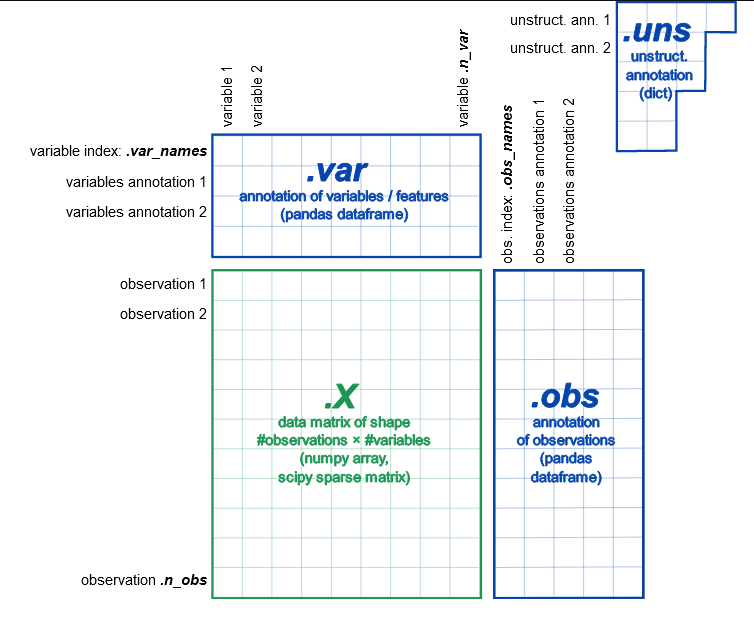

In [2]:
col_metadata = pd.read_csv(r'../data/column_metadata.csv', index_col=0)
row_metadata = pd.read_csv(r'../data/row_metadata.csv', index_col=0)

In [3]:
with h5py.File(r'../data/151507_raw_feature_bc_matrix.h5', "r") as f:
    f.visit(print)
    print(f['matrix']['features'].keys())

matrix
matrix/barcodes
matrix/data
matrix/features
matrix/features/_all_tag_keys
matrix/features/feature_type
matrix/features/genome
matrix/features/id
matrix/features/name
matrix/indices
matrix/indptr
matrix/shape
<KeysViewHDF5 ['_all_tag_keys', 'feature_type', 'genome', 'id', 'name']>


In [140]:
def load_sparse_mat(filtered_filename, sample_number):
    with h5py.File(filtered_filename, 'r') as f:
        data = np.array(f['matrix']['data'])
        filtered_barcodes = np.array(f['matrix']['barcodes']).astype('U13')  # b'AAACAAGTATCTCCCA-1'  4992 columns
        _id = np.array(f['matrix']['features']['id']).astype('U13')   #  b'ENSG00000275063' 33538 rows
        name = np.array(f['matrix']['features']['name']).astype('U13')   # Gene name b'AL627309.3' 33538 rows
        indices = np.array(f['matrix']['indices'])
        indptr = np.array(f['matrix']['indptr'])
        shape = np.array(f['matrix']['shape'])
        
    barcodes = pd.DataFrame(filtered_barcodes)
    barcodes['in_filtered'] = barcodes[0].isin(filtered_barcodes).astype('int')
    m = sparse.csr_matrix((data, indices, indptr), shape=(shape[1], shape[0]))
    index = [barcodes[0].astype('str').to_list(), 
             [str(sample_number)]*len(barcodes)]
    columns = [name, _id]
    return m.toarray()

def load_data():
    col_metadata = pd.read_csv(r'../data/column_metadata.csv', index_col=0)
    row_metadata = pd.read_csv(r'../data/row_metadata.csv', index_col=0)
    samples = [151507, 151669, 151673]
    filtfiles = [x for x in Path(r'..\data').glob('*filt*.h5')]
    filtfiles = [x for x in filtfiles if (str(samples[0]) in str(x)) or \
                 (str(samples[1]) in str(x)) or (str(samples[2]) in str(x))]
    dfs = []
    for filtered_file in filtfiles:
        sample_number = raw_file.stem.split('_')[0]
        df = load_sparse_mat(filtered_filename=filtered_file, 
                             sample_number=sample_number)
        dfs.append(df)
    cdf = np.concatenate(dfs)
    adata_master = sc.AnnData(
        X=cdf,   
        obs=col_metadata.loc[col_metadata.sample_name.isin([151507, 151669, 151673])],     
        var=row_metadata)  # obs = rows      var = cols
    del cdf
    del dfs
    return adata_master
adata_master = load_data()

# Filter genes with counts less than 100
high_count_genes = adata_master.X.sum(axis=0) > 100
adata_master = adata_master[:, high_count_genes]

C:\Users\bjanderson23\anaconda3\lib\site-packages\ipykernel_launcher.py:18: FutureWarning: X.dtype being converted to np.float32 from int32. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.


## All the clustering methods they provide:

In [146]:
for x in adata_master.obs.columns[18:]:
    if x == 'expr_chrM_ratio' or x == 'expr_chrM':
        continue
    try: 
        print(x, sorted(adata_master.obs[x].unique()))
    except: 
        print(x, (adata_master.obs[x].unique()))

cell_count [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27]
SNN_k50_k4 [1, 2, 3, 4]
SNN_k50_k5 [1, 2, 3, 4, 5]
SNN_k50_k6 [1, 2, 3, 4, 5, 6]
SNN_k50_k7 [1, 2, 3, 4, 5, 6, 7]
SNN_k50_k8 [1, 2, 3, 4, 5, 6, 7, 8]
SNN_k50_k9 [1, 2, 3, 4, 5, 6, 7, 8, 9]
SNN_k50_k10 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
SNN_k50_k11 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
SNN_k50_k12 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
SNN_k50_k13 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
SNN_k50_k14 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
SNN_k50_k15 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
SNN_k50_k16 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
SNN_k50_k17 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
SNN_k50_k18 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
SNN_k50_k19 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
SNN_k50_k20 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 2

# Figure 7 in paper shows Ground Truth vs Unsupervised clust vs. Semi-supervised vs. "Markers" ... ??

### best-performing implementations of:
### (1) unsupervised clustering (method ‘HVG_PCA_spatial’, which uses HVGs from scran and 50 PCs for dimension reduction and includes spatial coordinates as features for clustering); 
### (2) semi-supervised clustering guided by layer-enriched genes identified using the DE enrichment models 
### (3) clustering guided by known markers from Zeng et al

# Extended data figures 9 & 10 show different clusterings
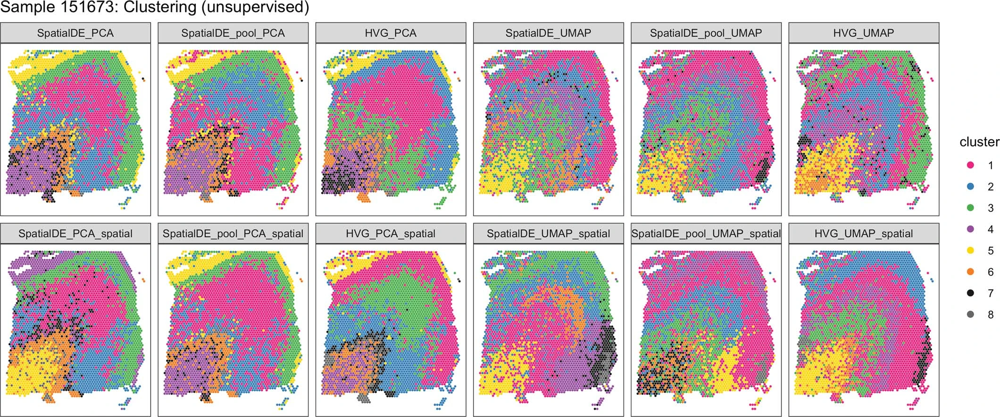

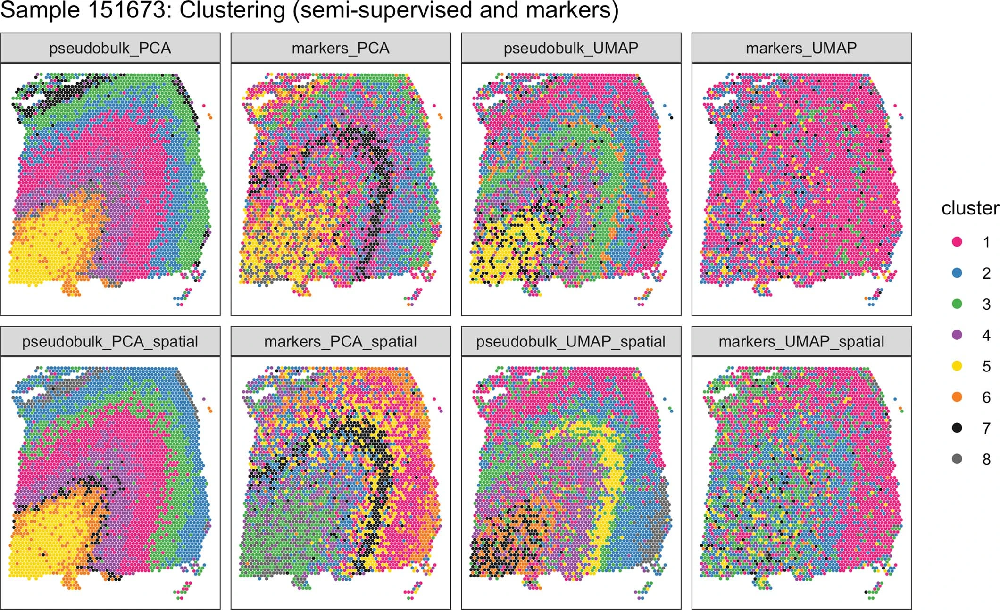

In [110]:
palette = {
    '1': "#ED247F",
    '2': '#397CBA',
    '3': '#49AB4F',
    '4': '#9A4D9E',
    '5': '#F9D606',
    '6': '#F47C20',
    '7': '#171717',
    '8': '#676767',
}

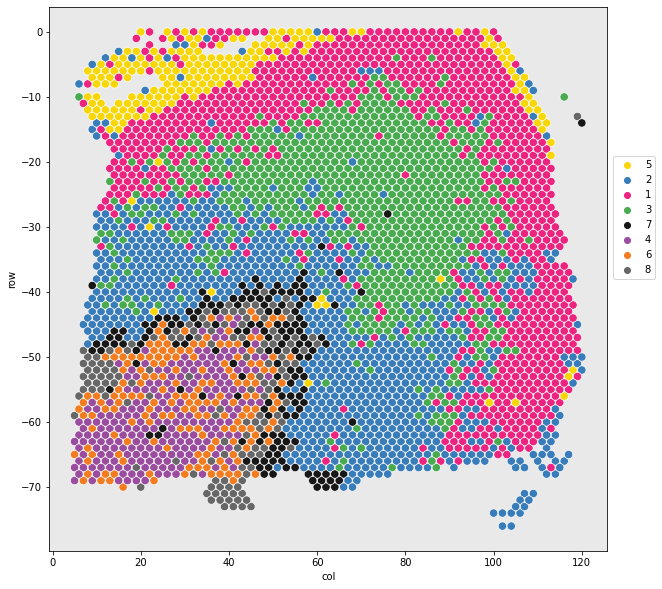

In [160]:
sns.scatterplot(data=d.obs.loc[d.obs['sample_name'] == 151673], 
                x='col', y=-1 * d.obs.row, 
                hue=d.obs['HVG_PCA_spatial'].astype('str'), 
                s=70, 
                palette=palette,
               )
plt.gcf().set_size_inches(10, 10)

# plt.gcf().set_facecolor('gray')
plt.gca().set_facecolor('#e9e9e9')
plt.legend(loc=(1.01, 0.5))

In [156]:
d.obs.columns

Index(['barcode', 'sample_name', 'tissue', 'row', 'col', 'imagerow',
       'imagecol', 'Cluster', 'height', 'width', 'sum_umi', 'sum_gene',
       'subject', 'position', 'replicate', 'subject_position', 'discard',
       'key', 'cell_count', 'SNN_k50_k4', 'SNN_k50_k5', 'SNN_k50_k6',
       'SNN_k50_k7', 'SNN_k50_k8', 'SNN_k50_k9', 'SNN_k50_k10', 'SNN_k50_k11',
       'SNN_k50_k12', 'SNN_k50_k13', 'SNN_k50_k14', 'SNN_k50_k15',
       'SNN_k50_k16', 'SNN_k50_k17', 'SNN_k50_k18', 'SNN_k50_k19',
       'SNN_k50_k20', 'SNN_k50_k21', 'SNN_k50_k22', 'SNN_k50_k23',
       'SNN_k50_k24', 'SNN_k50_k25', 'SNN_k50_k26', 'SNN_k50_k27',
       'SNN_k50_k28', 'GraphBased', 'Maynard', 'Martinowich', 'layer_guess',
       'layer_guess_reordered', 'layer_guess_reordered_short', 'expr_chrM',
       'expr_chrM_ratio', 'SpatialDE_PCA', 'SpatialDE_pool_PCA', 'HVG_PCA',
       'pseudobulk_PCA', 'markers_PCA', 'SpatialDE_UMAP',
       'SpatialDE_pool_UMAP', 'HVG_UMAP', 'pseudobulk_UMAP', 'markers_UMAP',
    

## the "spatialLIBD" annotation is the closest thing to a ground truth because it comes from the histology image 

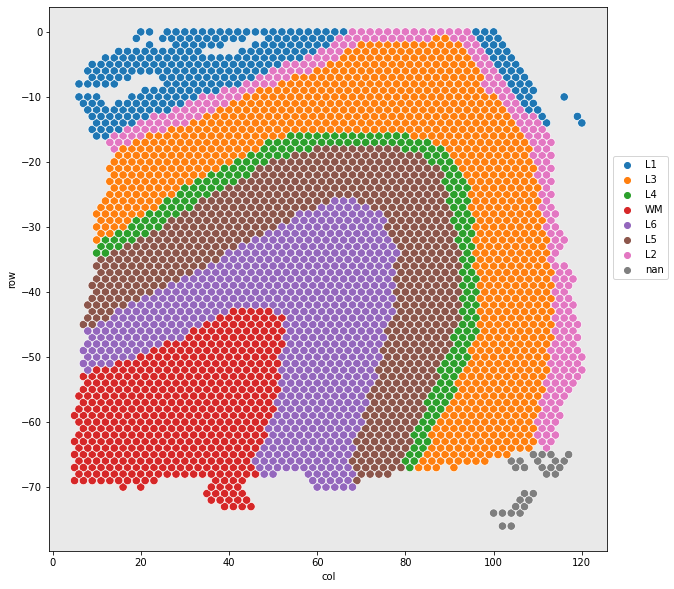

In [159]:
sns.scatterplot(data=d.obs.loc[d.obs['sample_name'] == 151673], 
                x='col', y=-1 * d.obs.row, 
                hue=d.obs['spatialLIBD'].astype('str'), 
                s=70, 
#                 palette=palette,
               )
plt.gcf().set_size_inches(10, 10)

# plt.gcf().set_facecolor('gray')
plt.gca().set_facecolor('#e9e9e9')
plt.legend(loc=(1.01, 0.5))

Text(0.5, 1.0, 'distribution of cell counts')

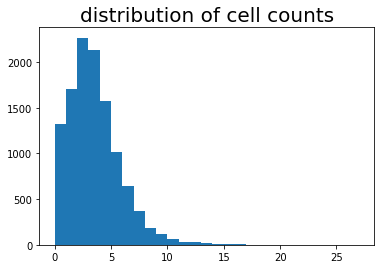

In [184]:
plt.hist(d.obs['cell_count'], bins=27);
plt.title('distribution of cell counts', fontsize=20)

In [210]:
reds = sns.palettes.color_palette(palette='Reds', n_colors=10)
reds_palette = list(reds)
reds_palette.extend([list(reds[-1]) for x in range(17)] )

[(0.9971703191080353, 0.901361014994233, 0.8562860438292964),
 (0.9926028450595925, 0.8141330257593233, 0.7383775470972702),
 (0.9882352941176471, 0.7068512110726644, 0.6010149942329873),
 (0.9882352941176471, 0.5857900807381776, 0.46223760092272204),
 (0.9857285659361784, 0.4722798923490965, 0.34678969627066514),
 (0.9673356401384082, 0.34918877354863515, 0.24775086505190314),
 (0.9256286043829296, 0.22006920415224915, 0.1677047289504037),
 (0.8193310265282583, 0.11672433679354094, 0.12341407151095732),
 (0.7130949634755863, 0.0744636678200692, 0.0962552864282968),
 (0.579361783929258, 0.04244521337946944, 0.07361783929257976),
 [0.579361783929258, 0.04244521337946944, 0.07361783929257976],
 [0.579361783929258, 0.04244521337946944, 0.07361783929257976],
 [0.579361783929258, 0.04244521337946944, 0.07361783929257976],
 [0.579361783929258, 0.04244521337946944, 0.07361783929257976],
 [0.579361783929258, 0.04244521337946944, 0.07361783929257976],
 [0.579361783929258, 0.04244521337946944, 0

In [214]:
brain = mpi.imread('../data/brain_images/151673_tissue_hires_image.png')

imagebox = OffsetImage(brain, zoom=0.2)

ab = AnnotationBbox(imagebox, (0.4, 0.6))

NameError: name 'OffsetImage' is not defined

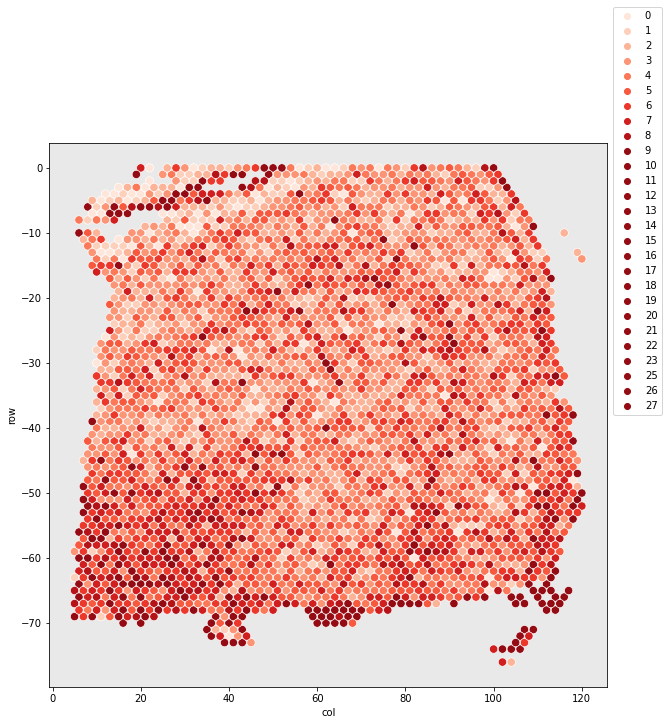

In [209]:
sns.scatterplot(data=d.obs.loc[d.obs['sample_name'] == 151673], 
                x='col', y=-1 * d.obs.row, 
                hue=d.obs['cell_count'], 
                s=70, 
                palette=a
               )
plt.gcf().set_size_inches(10, 10)

# plt.gcf().set_facecolor('gray')
plt.gca().set_facecolor('#e9e9e9')
plt.legend(loc=(1.01, 0.5))

In [150]:
normtot = copy.copy(adata_master)
sc.pp.normalize_total(normtot, exclude_highly_expressed=True, inplace=True)

C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


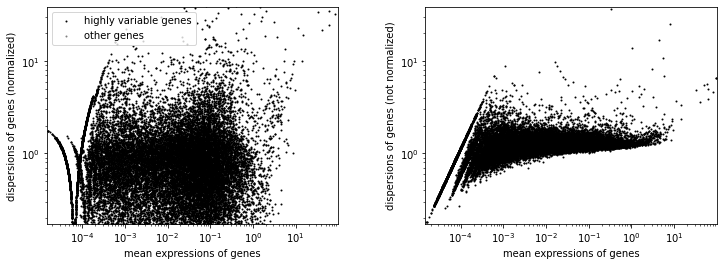

In [16]:
zheng17 = copy.deepcopy(adata_master)
sc.pp.recipe_zheng17(zheng17, n_top_genes=3000, plot=True)

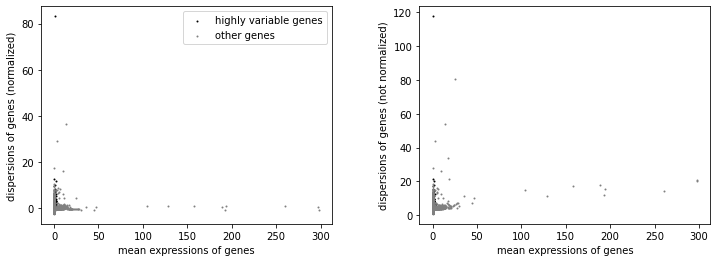

In [21]:
seurat = copy.deepcopy(adata_master)
sc.pp.recipe_seurat(seurat, plot=True)

In [33]:
weinreb17 = copy.copy(adata_master)
# weinreb17
# sc.pp.recipe_weinreb17(weinreb17)

In [35]:
weinreb17.shape

(11526, 23415)

In [11]:
normtot.obs.iloc[:10]

AttributeError: 'dict' object has no attribute 'obs'

In [36]:
adata[:, adata.obs.iloc[:1]]

IndexError: Unknown indexer                                barcode  sample_name  tissue  row  col  \
AAACAACGAATAGTTC-1  AAACAACGAATAGTTC-1       151507       1    0   16   

                      imagerow    imagecol  Cluster  height  width  ...  \
AAACAACGAATAGTTC-1  113.141318  147.434749        6     600    600  ...   

                    HVG_PCA_spatial  pseudobulk_PCA_spatial  \
AAACAACGAATAGTTC-1                5                       4   

                   markers_PCA_spatial  SpatialDE_UMAP_spatial  \
AAACAACGAATAGTTC-1                   3                       1   

                    SpatialDE_pool_UMAP_spatial HVG_UMAP_spatial  \
AAACAACGAATAGTTC-1                            1                1   

                    pseudobulk_UMAP_spatial markers_UMAP_spatial  spatialLIBD  \
AAACAACGAATAGTTC-1                        1                    1           L1   

                    ManualAnnotation  
AAACAACGAATAGTTC-1               NaN  

[1 rows x 74 columns] of type <class 'pandas.core.frame.DataFrame'>